## Panasonic SOC Prediction - Convolutional Neural Net (DNN)
Panasonic 18650PF Li-ion Battery Data - https://data.mendeley.com/datasets/wykht8y7tg/1

Kollmeyer, Phillip (2018), “Panasonic 18650PF Li-ion Battery Data”, Mendeley Data, V1, doi: 10.17632/wykht8y7tg.1

In [5]:
import os
import sys
import IPython
import IPython.display
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import collections
from numpy import reshape, array
from datetime import datetime, timedelta

import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Conv1D
from keras.layers.core import Dense
from tensorflow.keras import layers

cell_type = "panasonic"
model_type = "cnn_model"
base_path = '../../'

sys.path.append(base_path)
from training import utils

panasonic_data_path = base_path + 'datasets/Panasonic_18650PF'
lg_data_path = base_path + 'datasets/LG_18650HG2'
pre_trained_path = base_path + 'pre-trained/' + cell_type + '_' + model_type

resample_1hz = True
vi_averages = True

## Panasonic Test, Train Processing

In [25]:
panasonic_test_temps = ['n10degC', '0degC', '10degC', '25degC']
panasonic_test_discharge_cycles = ['US06', 'LA92', 'NN']

panasonic_train_temps = ['n10degC', '0degC', '10degC', '25degC']
panasonic_train_discharge_cycles = ['UDDS', 'HWFET', 'HWFT']

panasonic_train_files = utils.panasonic_get_files(panasonic_data_path,
                                                  panasonic_train_discharge_cycles, 
                                                  panasonic_train_temps)

panasonic_test_files = utils.panasonic_get_files(panasonic_data_path, 
                                                 panasonic_test_discharge_cycles,
                                                 panasonic_test_temps)

for file in panasonic_train_files:
    if "UDDS_LA92" in file or "LA92_NN" in file:
        panasonic_train_files.remove(file)

for file in panasonic_test_files:
    if "UDDS_LA92" in file or "LA92_NN" in file:
        panasonic_test_files.remove(file)


panasonic_train, panasonic_train_norm = utils.panasonic_create_dataset(panasonic_train_files,
                                                                       panasonic_train_discharge_cycles, 
                                                                       vi_averages, 
                                                                       resample_1hz)

panasonic_test, panasonic_test_norm = utils.panasonic_create_dataset(panasonic_test_files, 
                                                                     panasonic_test_discharge_cycles, 
                                                                     vi_averages, 
                                                                     resample_1hz)

../../datasets/Panasonic_18650PF/0degC/Drive cycles/06-02-17_10.43 0degC_HWFET_Pan18650PF.csv 59854
../../datasets/Panasonic_18650PF/0degC/Drive cycles/06-02-17_17.14 0degC_UDDS_Pan18650PF.csv 128522
../../datasets/Panasonic_18650PF/10degC/Drive Cycles/03-27-17_09.06 10degC_HWFET_Pan18650PF.csv 70406
../../datasets/Panasonic_18650PF/10degC/Drive Cycles/03-27-17_09.06 10degC_UDDS_Pan18650PF.csv 210465
../../datasets/Panasonic_18650PF/25degC/Drive cycles/03-20-17_05.56 25degC_HWFTa_Pan18650PF.csv 75955
../../datasets/Panasonic_18650PF/25degC/Drive cycles/03-20-17_19.27 25degC_HWFTb_Pan18650PF.csv 75811
../../datasets/Panasonic_18650PF/25degC/Drive cycles/03-21-17_00.29 25degC_UDDS_Pan18650PF.csv 224187
../../datasets/Panasonic_18650PF/n10degC/Drive Cycles/06-07-17_08.39 n10degC_HWFET_Pan18650PF.csv 51385
../../datasets/Panasonic_18650PF/n10degC/Drive Cycles/06-07-17_08.39 n10degC_UDDS_Pan18650PF.csv 109717
../../datasets/Panasonic_18650PF/0degC/Drive cycles/06-01-17_10.36 0degC_LA92_Pan1

## Panasonic Train, Test Stats

In [4]:
panasonic_train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Voltage,96547.0,3.627809,0.247314,2.498190,3.458090,3.624720,3.815960,4.200710
Current,96547.0,-0.772951,1.119336,-7.437770,-1.506660,-0.620630,-0.071050,5.511660
Temperature,96547.0,12.290873,12.484846,-9.262373,1.796085,11.416263,26.045400,29.822570
Power,96547.0,-2.712749,3.963937,-18.927653,-5.428331,-2.280660,-0.276703,19.280503
Capacity,96547.0,0.481228,0.283894,0.000000,0.238972,0.492247,0.725709,0.968880
Voltage Average,96547.0,3.643568,0.235658,3.021374,3.470979,3.639031,3.828227,4.110933
Current Average,96547.0,-0.793547,0.440024,-1.926452,-1.236214,-0.620933,-0.405029,-0.192152
Power Average,96547.0,-2.798013,1.535319,-5.868891,-4.371582,-2.199998,-1.425870,-0.527066


In [5]:
panasonic_test.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Voltage,86137.0,3.607147,0.258449,2.492400,3.435570,3.606060,3.797790,4.214870
Current,86137.0,-1.069468,2.368708,-20.484090,-2.044820,-0.278470,-0.000820,9.657050
Temperature,86137.0,13.479079,11.563432,-8.124518,3.494127,12.690260,26.460110,32.770330
Power,86137.0,-3.560242,8.096008,-53.488989,-7.269278,-1.000200,-0.003115,35.042827
Capacity,86137.0,0.464514,0.280495,0.000000,0.221123,0.467619,0.708228,0.963880
Voltage Average,86137.0,3.627756,0.226462,3.038145,3.458828,3.622753,3.802566,4.101948
Current Average,86137.0,-1.106134,0.568743,-2.986729,-1.332306,-0.888142,-0.748530,-0.242808
Power Average,86137.0,-3.706243,1.849461,-9.172898,-4.301810,-2.999961,-2.615629,-0.702527


## Panasonic Dataset Figures, Distribution

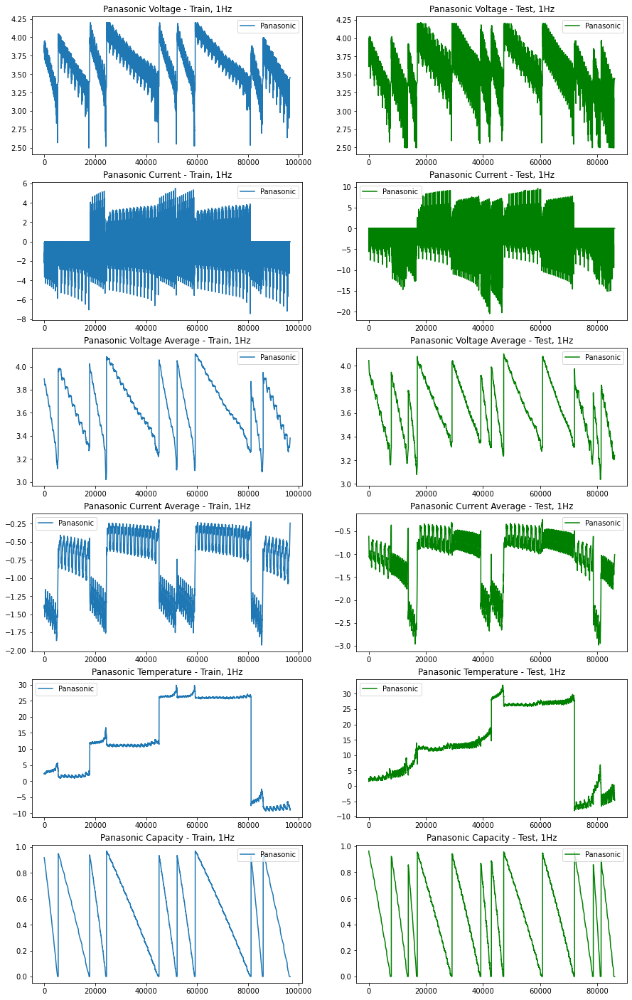

In [6]:
plot_cols = ['Voltage', 'Current', 'Voltage Average', 'Current Average', 'Temperature', 'Capacity']

fig, axs = plt.subplots(nrows=len(plot_cols), ncols=2, figsize=(15, 25))

for i, col in enumerate(plot_cols):
    axs[i, 0].plot(panasonic_train[col], label='Panasonic')
    axs[i, 0].set_title(f'Panasonic {col} - Train, 1Hz')
    axs[i, 0].legend()
    
    axs[i, 1].plot(panasonic_test[col], label='Panasonic', color="green")
    axs[i, 1].set_title(f'Panasonic {col} - Test, 1Hz')
    axs[i, 1].legend()

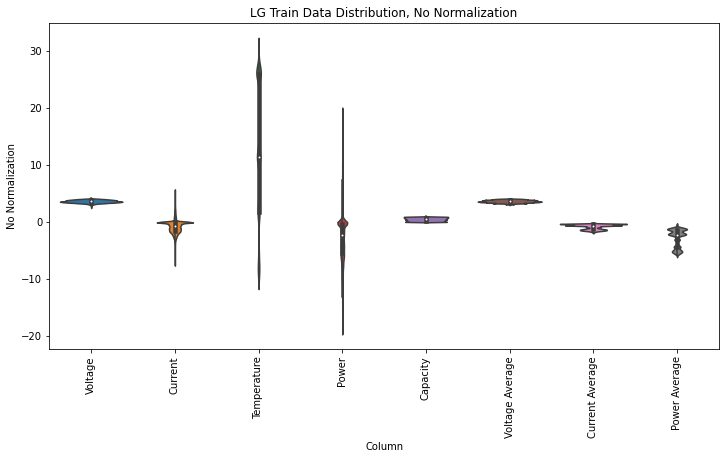

In [7]:
df_std = panasonic_train.melt(var_name='Column', value_name='No Normalization')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='No Normalization', data=df_std)
_ = ax.set_xticklabels(panasonic_train.keys(), rotation=90)
_ = ax.set_title(label='Panasonic Train Data Distribution, No Normalization')

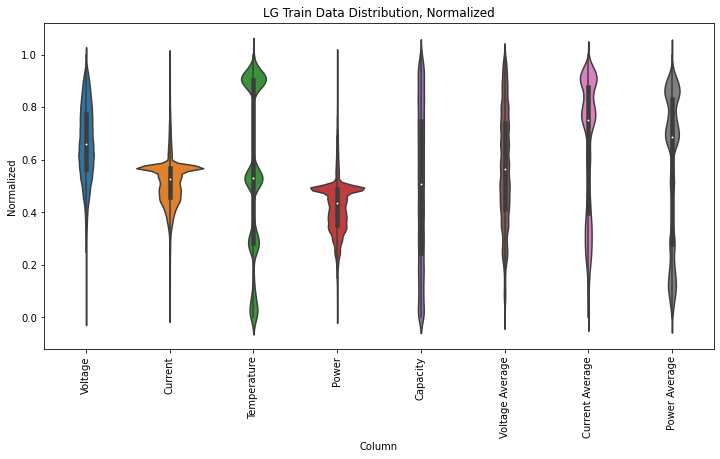

In [8]:
df_std = panasonic_train_norm.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(panasonic_train_norm.keys(), rotation=90)
_ = ax.set_title(label='Panasonic Train Data Distribution, Normalized')

Text(0.5, 1.01, 'Pair Plot, LG Training Dataset')

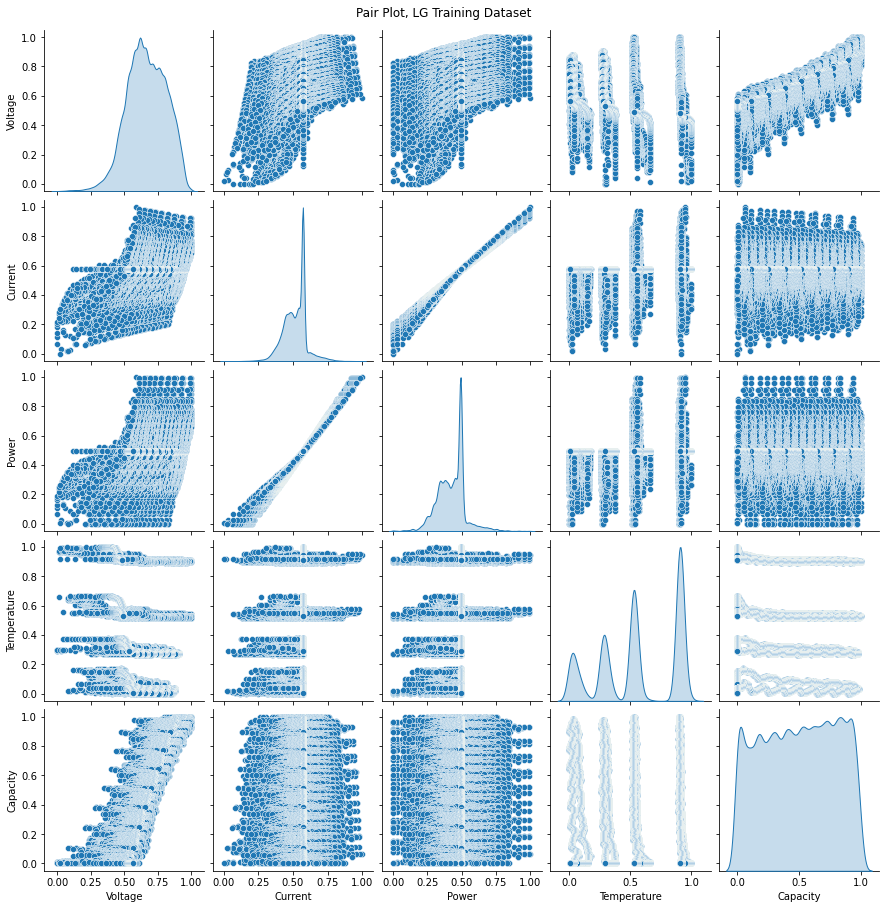

In [9]:
ax = sns.pairplot(panasonic_train_norm[['Voltage', 'Current', 'Power', 'Temperature', 'Capacity']], diag_kind='kde')
ax.fig.suptitle("Pair Plot, Panasonic Training Dataset", y = 1.01) 

## CNN MODEL TRAINING

In [26]:
train_features = panasonic_train_norm[['Voltage', 'Current', 'Voltage Average', 'Current Average', 'Temperature', 'Capacity']].copy()
test_features = panasonic_test_norm[['Voltage', 'Current', 'Voltage Average', 'Current Average', 'Temperature', 'Capacity']].copy()

train_labels = train_features.pop('Capacity')
test_labels = test_features.pop('Capacity')

In [27]:
# reshape for CNN 1-D
train_array = array(train_features)
labels_array = array(train_labels)

sample_size = train_features.shape[0]
time_steps = train_features.shape[1]
input_dimension = 1

train_reshaped = train_array.reshape((sample_size,time_steps,1))
labels_reshaped = labels_array.reshape((train_labels.shape[0],1,1))

print(train_reshaped.shape)
print(labels_reshaped.shape)

(96547, 5, 1)
(96547, 1, 1)


In [28]:
# cnn model definition
cnn_model = Sequential()
cnn_model.add(Conv1D(filters=32,
                     kernel_size=(train_features.shape[1],),
                     activation='relu'))
cnn_model.add(Dense(32, activation='relu'))
cnn_model.add(Dense(1))

cnn_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mean_absolute_error')

In [30]:
%%time
history = cnn_model.fit(
    train_reshaped, 
    train_labels,             
    epochs=25, batch_size=32, 
    verbose=1, validation_split=0.2)

Epoch 1/25
2414/2414 [==============================] - 11s 5ms/step - loss: 0.0057 - val_loss: 0.0345
Epoch 2/25
2414/2414 [==============================] - 16s 7ms/step - loss: 0.0052 - val_loss: 0.0337
Epoch 3/25
2414/2414 [==============================] - 12s 5ms/step - loss: 0.0052 - val_loss: 0.0330
Epoch 4/25
2414/2414 [==============================] - 10s 4ms/step - loss: 0.0050 - val_loss: 0.0333
Epoch 5/25
2414/2414 [==============================] - 10s 4ms/step - loss: 0.0049 - val_loss: 0.0324
Epoch 6/25
2414/2414 [==============================] - 16s 6ms/step - loss: 0.0048 - val_loss: 0.0325
Epoch 7/25
2414/2414 [==============================] - 10s 4ms/step - loss: 0.0046 - val_loss: 0.0324
Epoch 8/25
2414/2414 [==============================] - 14s 6ms/step - loss: 0.0046 - val_loss: 0.0325
Epoch 9/25
2414/2414 [==============================] - 15s 6ms/step - loss: 0.0045 - val_loss: 0.0319
Epoch 10/25
2414/2414 [==============================] - 10s 4ms/step - l

## SAVE MODEL, EVALUATE

In [31]:
cnn_model.save(pre_trained_path)

# load pre-trained model
# model = tf.keras.models.load_model(pre_trained_path)

INFO:tensorflow:Assets written to: ../../pre-trained/panasonic_cnn_model/assets


INFO:tensorflow:Assets written to: ../../pre-trained/panasonic_cnn_model/assets


In [32]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
20,0.003972,0.033090,20
21,0.003883,0.033480,21
22,0.003771,0.033904,22
23,0.003880,0.034196,23
24,0.003713,0.035906,24


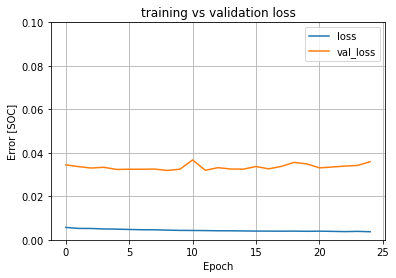

In [33]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 0.1])
    plt.xlabel('Epoch') 
    plt.ylabel('Error [SOC]')
    plt.title('training vs validation loss')
    plt.legend()
    plt.grid(True)
    
plot_loss(history)

2692/2692 - 6s - loss: 0.0528 - 6s/epoch - 2ms/step
2692/2692 [==============================] - 11s 4ms/step


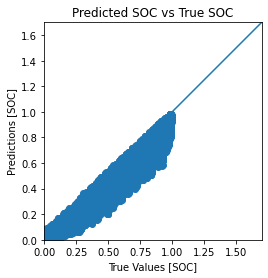

In [34]:
test_results = cnn_model.evaluate(test_features, test_labels, verbose=2)
test_predictions = cnn_model.predict(test_features).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [SOC]')
plt.ylabel('Predictions [SOC]')
lims = [0, 1.7]
plt.xlim(lims)
plt.ylim(lims)
plt.title('Predicted SOC vs True SOC')
_ = plt.plot(lims, lims)

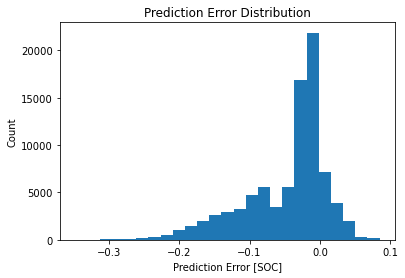

In [35]:
error = test_predictions - test_labels
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [SOC]')
plt.title('Prediction Error Distribution')
_ = plt.ylabel('Count')

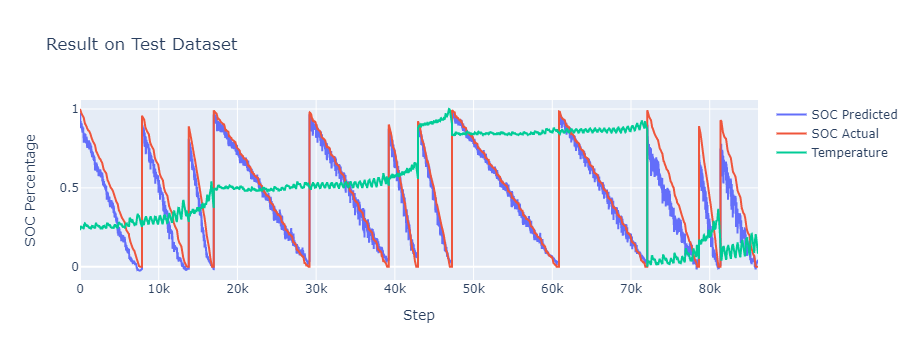

In [36]:
import plotly.graph_objects as go

cycle_num = 0
steps_num = 100000
step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

fig = go.Figure()
fig.add_trace(go.Scatter(x=step_index, y=test_predictions[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SOC Predicted'))
fig.add_trace(go.Scatter(x=step_index, y=test_labels[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SOC Actual'))
fig.add_trace(go.Scatter(x=step_index, y=panasonic_test_norm['Temperature'][cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='Temperature'))
fig.update_layout(title='Result on Test Dataset',
                  xaxis_title='Step',
                  yaxis_title='SOC Percentage')
fig.show()